# Playground S3E4

The goal of this notebook is to predict the probability for the target `Class` for each `id` in the test set using synthetic data from the [Credit Card Fraud Detection](https://www.kaggle.com/datasets/mlg-ulb/creditcardfraud) dataset combined with the original dataset.

## Table of Contents
<a id="toc"></a>
- [1. Imports](#1)
- [2. Data Loading and Preperation](#2)
- [3. EDA](#3)
- [4. Data Cleaning and Processing](#4)   
- [5. Modelling](#5)
- [6. Submission](#6)  

<a id="1"></a>
## Imports

In [2]:
%%capture
!pip install dataprep auto-sklearn shutup

In [3]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from dataprep.eda import create_report

from sklearn.model_selection import train_test_split
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.compose import ColumnTransformer

from sklearn.model_selection import StratifiedKFold, RepeatedStratifiedKFold
from sklearn.ensemble import VotingClassifier
from sklearn.neural_network import MLPClassifier
import xgboost as xgb
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
import optuna
from sklearn.metrics import make_scorer, roc_auc_score

import time
import warnings
warnings.filterwarnings('ignore')
import shutup
shutup.please()

<a id="2"></a>
# Load Data

In [50]:
train = pd.read_csv("/kaggle/input/playground-series-s3e4/train.csv")
test = pd.read_csv("/kaggle/input/playground-series-s3e4/test.csv")
submission = pd.read_csv("/kaggle/input/playground-series-s3e4/sample_submission.csv")
creditcard = pd.read_csv('/kaggle/input/creditcardfraud/creditcard.csv')

RANDOM_STATE = 42

- `id` - Unique id for each row. 
- `Time` - Seconds elapsed between this transaction and the first transaction in the dataset
- `V1-V28` - Features with dimensionality reduction to protect sensitive features
- `Amount` - Transaction amount
- `Class` - Target Class (1 for fraudulent transactions, 0 otherwise)

### Exploring Train Data

- There are 32 columns and 219129 rows.
- 30 continous features 1 id and 1 target column
- Class is the target variable
- No missing values

In [40]:
train.head()

,id,Time,V1,V2,V3,V4,V5,V6,V7,V8,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0,0.0,2.074329,-0.129425,-1.137418,0.412846,-0.192638,-1.210144,0.110697,-0.263477,...,-0.334701,-0.887840,0.336701,-0.110835,-0.291459,0.207733,-0.076576,-0.059577,1.98,0
1,1,0.0,1.998827,-1.250891,-0.520969,-0.894539,-1.122528,-0.270866,-1.029289,0.050198,...,0.054848,-0.038367,0.133518,-0.461928,-0.465491,-0.464655,-0.009413,-0.038238,84.00,0
2,2,0.0,0.091535,1.004517,-0.223445,-0.435249,0.667548,-0.988351,0.948146,-0.084789,...,-0.326725,-0.803736,0.154495,0.951233,-0.506919,0.085046,0.224458,0.087356,2.69,0
3,3,0.0,1.979649,-0.184949,-1.064206,0.120125,-0.215238,-0.648829,-0.087826,-0.035367,...,-0.095514,-0.079792,0.167701,-0.042939,0.000799,-0.096148,-0.057780,-0.073839,1.00,0
4,4,0.0,1.025898,-0.171827,1.203717,1.243900,-0.636572,1.099074,-0.938651,0.569239,...,0.099157,0.608908,0.027901,-0.262813,0.257834,-0.252829,0.108338,0.021051,1.00,0


In [41]:
train.describe()

,id,Time,V1,V2,V3,V4,V5,V6,V7,V8,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,...,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000,219129.000000
mean,109564.000000,62377.415376,0.096008,0.048345,0.592102,0.069273,-0.161555,0.133688,-0.128224,0.149534,...,-0.031064,-0.050852,-0.050531,-0.002992,0.124005,0.009881,0.014034,0.017313,66.359803,0.002140
std,63257.237906,25620.348569,1.395425,1.159805,1.132884,1.253125,1.069530,1.202411,0.817207,0.716212,...,0.422777,0.597812,0.318175,0.593100,0.406741,0.473867,0.233355,0.164859,150.795017,0.046214
min,0.000000,0.000000,-29.807725,-44.247914,-19.722872,-5.263650,-37.591259,-25.659750,-31.179799,-28.903442,...,-14.689621,-8.748979,-11.958588,-2.836285,-3.958591,-1.858672,-9.234767,-4.551680,0.000000,0.000000
25%,54782.000000,47933.000000,-0.846135,-0.573728,-0.027154,-0.769256,-0.847346,-0.631835,-0.646730,-0.095948,...,-0.190418,-0.473099,-0.174478,-0.332540,-0.126080,-0.318330,-0.050983,-0.009512,5.990000,0.000000
50%,109564.000000,63189.000000,0.385913,0.046937,0.735895,0.064856,-0.229929,-0.087778,-0.098970,0.111219,...,-0.042858,-0.032856,-0.063307,0.038708,0.145934,-0.086388,0.015905,0.022163,21.900000,0.000000
75%,164346.000000,77519.000000,1.190661,0.814145,1.306110,0.919353,0.356856,0.482388,0.385567,0.390976,...,0.109187,0.354910,0.060221,0.394566,0.402926,0.253869,0.076814,0.066987,68.930000,0.000000
max,219128.000000,120580.000000,2.430494,16.068473,6.145578,12.547997,34.581260,16.233967,39.824099,18.270586,...,22.062945,6.163541,12.734391,4.572739,3.111624,3.402344,13.123618,23.263746,7475.000000,1.000000


### Exploring Credit Card Dataset

- There are 32 columns and 284807 rows.
- 30 continous features 1 id and 1 target column
- Class is the target variable
- No missing values

In [49]:
creditcard.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [46]:
creditcard.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


### Exploring Test Data

- There are 31 columns and 146087 rows.
- 30 continous features and 1 id column
- No missing values

In [6]:
test.head()

,id,Time,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
0,219129,120580.0,2.115519,-0.691809,-1.305514,-0.685655,-0.641265,-0.764784,-0.924262,-0.023030,...,0.067367,0.241708,0.682524,0.037769,-0.546859,-0.123055,-0.084889,0.004720,-0.021944,29.95
1,219130,120580.0,1.743525,-1.681429,-0.547387,-1.061113,-0.695825,2.458824,-1.632859,1.073529,...,0.441788,0.543278,1.294571,0.309541,3.703925,-0.242579,0.068708,0.002629,0.064690,163.50
2,219131,120580.0,2.205568,-1.571445,-0.238965,-1.662517,-1.652324,-0.054701,-1.682064,0.105613,...,-0.366906,-0.131527,0.086623,0.291375,0.739087,-0.543006,-0.297813,0.043699,-0.037855,16.00
3,219132,120580.0,1.989728,-0.972909,-1.938259,-1.440129,-0.166855,-0.794048,0.252889,-0.399789,...,-0.049136,-0.080115,-0.010732,-0.038550,0.656830,0.343470,-0.627529,-0.024338,-0.036143,120.98
4,219133,120580.0,-1.943548,-1.668761,0.363601,-0.977610,2.684779,-2.037681,0.039709,-0.048895,...,0.391627,0.083389,-0.306918,0.247822,-0.391799,-0.790716,-0.025706,0.330758,0.335537,1.98


In [7]:
test.describe()

,id,Time,V1,V2,V3,V4,V5,V6,V7,V8,...,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount
count,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,...,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000,146087.000000
mean,292172.000000,144637.928166,0.512929,-0.013098,-0.697478,-0.273258,0.321856,-0.050204,0.073419,0.043803,...,-0.056678,0.044729,0.175461,0.018471,0.016029,-0.118352,-0.015199,0.006236,0.002035,66.182463
std,42171.828725,14258.025396,1.628455,1.247749,1.292522,1.365752,1.146215,1.332880,0.946681,0.749513,...,0.458364,0.449017,0.710704,0.359597,0.633929,0.479720,0.446154,0.255935,0.174613,153.151535
min,219129.000000,120580.000000,-34.755944,-37.803827,-18.934952,-5.497560,-25.639591,-14.133040,-18.715915,-26.926164,...,-26.412867,-13.087263,-5.392649,-12.814296,-2.789084,-3.361564,-1.743223,-9.412538,-8.262339,0.000000
25%,255650.500000,132698.000000,-0.679988,-0.715885,-1.619268,-1.021205,-0.418547,-0.891441,-0.570042,-0.231824,...,-0.237529,-0.166715,-0.393667,-0.135059,-0.368957,-0.409938,-0.284914,-0.066037,-0.057447,5.990000
50%,292172.000000,144493.000000,0.285798,0.009058,-0.719060,-0.482945,0.306851,-0.372813,0.118545,0.014979,...,-0.096729,0.058393,0.250169,0.017835,0.029727,-0.142325,-0.069342,-0.003539,-0.026955,21.790000
75%,328693.500000,156140.000000,1.974015,0.827420,0.073874,0.369725,0.955997,0.302724,0.734503,0.296969,...,0.065753,0.244817,0.749555,0.167514,0.562138,0.182937,0.216632,0.069334,0.066954,66.000000
max,365215.000000,172790.000000,2.452901,12.390128,4.492640,11.232928,24.352818,16.596635,27.023955,12.098322,...,15.829261,15.333546,5.771245,17.481609,4.541724,4.555960,3.374748,12.673968,13.093229,4630.600000


### Exploring Submission File

- There are 2 columns and 146087 rows.
- 1 id and 1 target column

In [8]:
submission.head()

,id,Class
0,219129,0.5
1,219130,0.5
2,219131,0.5
3,219132,0.5
4,219133,0.5


<a href="#toc" role="button" aria-pressed="true" > Back to Table of Contents </a>

<a id="3"></a>
## EDA

- Highly imbalanced dataset, with only 0.2% are fradulance cases
- Most features are uncorrelated, which is expected as V1-V28 are principal components
- Most are not normally distributed.

In [51]:
# Combine train and creditcard
train = pd.concat([train, creditcard], axis=0, ignore_index=True)

  0%|          | 0/7593 [00:00<?, ?it/s]


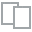
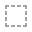
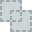
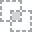
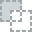
...
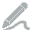
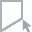
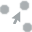
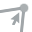
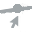

In [52]:
report = create_report(train)
report.show()

<a href="#toc" role="button" aria-pressed="true" > Back to Table of Contents </a>

<a id="4"></a>
## Data Cleaning and Processing

- Drop duplicates in features
- Normalization using Robust Scaler

In [25]:
features = ['V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9',
       'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19',
       'V20', 'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount']

print("Train duplicates:" , train.duplicated(subset = features).sum())

train = train.drop_duplicates(subset = features)

Train duplicates: 0


In [26]:
def prepare_data(train, test):
    """
    Function that takes in a train and test dataframe, prepares the feature and target data 
    and performs train-test split.

    Parameters:
    - train: training data dataframe
    - test: testing data dataframe

    Returns:
    - X_train, X_val, y_train, y_val, X_test
    """
    X_train = train.drop(columns=["id", "Time", "Class"], axis = 1)
    y_train = train.Class
    X_test = test.drop(columns=["id", "Time"], axis = 1)

    X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.1, random_state=RANDOM_STATE)
    
    return X_train, X_val, y_train, y_val, X_test

((197131, 29), (197131,), (146037, 29))

In [ ]:
X_train, X_val, y_train, y_val, X_test = prepare_data(train, test)

RobustScaler is a method for normalizing numerical data by subtracting the median and dividing by the interquartile range. This method is robust to outliers, as it only uses the median and quartiles to compute the scaling, and thus it does not rely on the assumption that the data follows a normal distribution.

This will be peformed separtely between train, val, and test sets to prevent data leakage. Data leakage can lead to overfitting and poor generalization performance on unseen data.

In [7]:
def transform_data(train, val, test, features):
    # Create the transformer: robust_scaler
    robust_scaler = RobustScaler()

    # Create the column transformer
    ct = ColumnTransformer(transformers=[('robust_scaler', robust_scaler, features)])

    # Create the pipeline: pipeline
    pipeline = Pipeline([('ct', ct)])

    # Fit and transform the data
    X_train_scaled = pipeline.fit_transform(train)
    X_val_scaled = pipeline.fit_transform(val)
    X_test_scaled = pipeline.fit_transform(test)
    
    return X_train_scaled, X_val_scaled, X_test_scaled

 X_train_scaled, X_val_scaled, X_test_scaled = transform_data(X_train, X_val, X_test, features)

<a href="#toc" role="button" aria-pressed="true" > Back to Table of Contents </a>

<a id="5"></a>
## Modelling

For a credit card fraud dataset with a very small number of fraudulent cases. Some of the most popular models for binary classification include:

- XGBoost Classifier: XGBoost is an optimized gradient boosting library that is designed for speed and performance. It's a powerful algorithm that can handle large datasets and categorical features, and can work well with imbalanced datasets.
- LightGBM Classifier: LightGBM is a gradient boosting framework that uses tree-based learning algorithms. It's designed to be efficient and scalable and it works well with large datasets, high dimensional data, and imbalanced datasets.
- Neural Networks (MLP): Neural networks can be used to classify credit card fraud data, they can learn complex non-linear relationships between features and output, they can work well with large datasets, high-dimensional data and imbalanced datasets.In the case of a credit card fraud dataset with a very small number of fraudulent cases, several machine learning models can be used to achieve a good AUC-ROC score. Some of the most popular models for binary classification include:

### Evaluating models

Metrics that are sensitive to the imbalance:

- Precision: Precision measures the proportion of true positive predictions out of all positive predictions. In the case of imbalanced datasets, precision is a good metric to use because it is not affected by the number of non-fraudulent cases.
- Recall (or Sensitivity or TPR): Recall measures the proportion of true positive predictions out of all actual positive cases. In the case of imbalanced datasets, recall is a good metric to use because it is sensitive to the imbalance and can help identify cases where the classifier is not detecting enough fraudulent cases.
- F1-Score: F1-score is the harmonic mean of precision and recall. In the case of imbalanced datasets, F1-score is a good metric to use because it balances the trade-off between precision and recall.
- Area Under the Receiver Operating Characteristic Curve (AUC-ROC): The ROC curve is a graphical representation of the performance of a binary classifier. The area under the ROC curve is a measure of the classifier's ability to distinguish between the two classes. In the case of imbalanced datasets, AUC-ROC is a good metric to use because it is insensitive to the imbalance in the dataset.

This notebook will focus on AUC-ROC since the submission is evaluated on this metric.

### Hyper-parameter tuning using Optuna

Optuna is an open-source Python library for automating the hyperparameter tuning process of machine learning models. It is designed to optimize the performance of a model by systematically searching for the best combination of hyperparameters. 

In [8]:
# Documentation for all objective functions
"""
    Function that uses Optuna to tune the hyperparameters of a Classifier.
    It suggests different values for the hyperparameters of the Classifier and
    fits the model with the suggested hyperparameters. Then it uses it to predict on validation set 
    and calculates the roc_auc_score. Then it returns this score.
    Args: 
        trial : Optuna trial object
    Returns:
        float : roc_auc_score
"""

def xgb_objective(trial):
    # Define the hyperparameters to optimize
    params = {
        'max_depth': trial.suggest_int('max_depth', 2, 10),
        'eta': trial.suggest_loguniform('eta', 0.01, 0.2),
        'subsample': trial.suggest_uniform('subsample', 0.5, 1.0),
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.5, 1.0),
        'lambda': trial.suggest_loguniform('lambda', 1e-8, 1.0),
        'alpha': trial.suggest_loguniform('alpha', 1e-8, 1.0),
        'objective': 'binary:logistic',
        'eval_metric': 'auc'
    }
    
    dtrain = xgb.DMatrix(X_train_scaled, label=y_train)
    dval = xgb.DMatrix(X_val_scaled, label=y_val)
    model = xgb.train(params, dtrain, num_boost_round=1000, evals=[(dval, 'val')],
                      early_stopping_rounds=10, verbose_eval=False, random_state=RANDOM_STATE)
    y_val_pred = model.predict_proba(X_val_scaled)[:, 1]
    auc = roc_auc_score(y_val, y_val_pred)
    return auc

def lgbm_objective(trial):
    
    model = LGBMClassifier(
        n_estimators=trial.suggest_int("n_estimators", 100, 1000),
        learning_rate=trial.suggest_loguniform("learning_rate", 1e-4, 1e-1),
        max_depth=trial.suggest_int("max_depth", 2, 10),
        min_child_samples=trial.suggest_int("min_child_samples", 5, 100),
        subsample=trial.suggest_uniform("subsample", 0.6, 1.0),
        subsample_freq=trial.suggest_int("subsample_freq", 0, 10),
        colsample_bytree=trial.suggest_uniform("colsample_bytree", 0.6, 1.0),
        reg_lambda=trial.suggest_loguniform("reg_lambda", 1e-4, 1e4),
        reg_alpha=trial.suggest_loguniform("reg_alpha", 1e-4, 1e4),
        n_jobs=-1
    )
    
    model.fit(X_train_scaled, y_train)
    y_pred = model.predict_proba(X_val_scaled)[:,1]
    score = roc_auc_score(y_val, y_pred)
    return score

def mlp_objective(trial):
    # Define the hyperparameters and their ranges
    hidden_layer_sizes = trial.suggest_int("hidden_layer_sizes", 50, 500)
    alpha = trial.suggest_loguniform("alpha", 1e-4, 1e-2)
    max_iter = trial.suggest_int("max_iter", 100, 1000)
    
    # Build the MLP classifier with the current set of hyperparameters
    clf = MLPClassifier(hidden_layer_sizes=hidden_layer_sizes, alpha=alpha, max_iter=max_iter)
    
    # Fit the classifier to the training data and evaluate its performance on the validation data
    clf.fit(X_train_scaled, y_train)
    y_proba = clf.predict_proba(X_val_scaled)[:, 1]
    score = roc_auc_score(y_val, y_proba)
    return score

def optimize(objective):
    study = optuna.create_study(direction='maximize')
    study.optimize(objective, n_trials=100)
    return study.best_params

In [9]:
# Get best parameters for each model
#xgb_params = optimize(xgb_objective)
#lgbm_params = optimize(lgbm_objective)
#mlp_params = optimize(mlp_objective)

In [10]:
# Hard code parameters after tuning 

xgb_params = {
    'max_depth': 7,
    'eta': 0.08340577666494564,
    'subsample': 0.9564280129428434,
    'colsample_bytree': 0.7991491948540769,
    'lambda': 3.099023643148376e-05,
    'alpha': 1.1570818554850244e-08
}
lgbm_params = {
    'n_estimators': 481,
    'learning_rate': 0.0037843728361241684,
    'max_depth': 9,
    'min_child_samples': 51,
    'subsample': 0.652502642273582,
    'subsample_freq': 0,
    'colsample_bytree': 0.8731257024828734,
    'reg_lambda': 0.006287747742873359,
    'reg_alpha': 5.7245464938784725
}

#lr_params = optimize(lr_objective)
mlp_params = {
    'hidden_layer_sizes': 295, 
    'alpha': 0.009931789375116531, 
    'max_iter': 353
}

In [11]:
# Define the individual models
model1 = XGBClassifier(**xgb_params)
model2 = LGBMClassifier(**lgbm_params)
model3 = MLPClassifier(**mlp_params)

# Define the ensemble model
ensemble_model = VotingClassifier(estimators=[('xgb', model1), ('lgbm', model2), ('mlp', model3)], voting='soft')

In [47]:
def predict_and_score(model, X, y):
    """
    Function that performsclassification using model while using ROC AUC as the evaluation metric, 
    and also using stratified K-fold cross-validation.
    
    Parameters:
    - model: xgboost model
    - X: features
    - y: labels
    - n_splits: number of splits for K-fold cross-validation (default: 5)
    
    Returns:
    - mean ROC AUC score from K-fold cross-validation
    """
    predictions = []
    true_values = []
    skf = StratifiedKFold(n_splits=5, random_state=RANDOM_STATE, shuffle=True)
    for train_index, val_index in skf.split(X, y):
        X_train, X_val = X[train_index], X[val_index]
        y_train, y_val = y.iloc[train_index], y.iloc[val_index]
        model.fit(X_train, y_train)
        y_pred = model.predict_proba(X_val)[:, 1]
        predictions.append(y_pred)
        true_values.append(y_val)
    predictions = np.concatenate(predictions)
    true_values = np.concatenate(true_values)
    auc_roc = roc_auc_score(true_values, predictions)
    return predictions, auc_roc

predict_and_score(ensemble_model, X_train_scaled, y_train)

(array([0.00276639, 0.0026738 , 0.00050173, ..., 0.00050663, 0.00115078,
        0.00096844]),
 0.8226924837887881)

<a href="#toc" role="button" aria-pressed="true" > Back to Table of Contents </a>

<a id="6"></a>
## Submission

RepeatedStratifiedKFold is an extension of StratifiedKFold that repeats the K-fold process multiple times, with different random seed each time, and takes the average performance across all folds. This is useful for improving the robustness of the cross-validation performance estimation, especially when the dataset is small or the class labels are imbalanced.

In [20]:
def predict_on_X_test(model, X_train, y_train, X_test):
    """
    Function that performs binary classification using the provided model on X_train and y_train,
    and predicts on X_test using repeated stratified K-fold cross-validation.
    
    Parameters:
    - model: the classifier model to be used for training
    - X_train: training features
    - y_train: training labels
    - X_test: test features
    
    Returns:
    - list of predicted probabilities for X_test
    """
    predictions = []
    rskf = RepeatedStratifiedKFold(n_splits=5, n_repeats=2, random_state=RANDOM_STATE)
    for train_index, val_index in rskf.split(X_train, y_train):
        X_train_cv, X_val_cv = X_train[train_index], X_train[val_index]
        y_train_cv, y_val_cv = y_train.iloc[train_index], y_train.iloc[val_index]
        model.fit(X_train_cv, y_train_cv)
        y_pred = model.predict_proba(X_test)[:, 1]
        predictions.append(y_pred)
    return np.mean(predictions, axis=0)

In [29]:
X = train.drop(columns=["id", "Time", "Class"], axis = 1)
y = train.Class
test = test.drop(columns=["id", "Time"] , axis = 1)

# Create the transformer: robust_scaler
robust_scaler = RobustScaler()

# Create the column transformer
ct = ColumnTransformer(transformers=[('robust_scaler', robust_scaler, features)])

# Create the pipeline: pipeline
pipeline = Pipeline([('ct', ct)])

# Fit and transform the data
X_scaled = pipeline.fit_transform(X)
test_scaled = pipeline.fit_transform(y)

predictions = predict_on_X_test(ensemble_model, X_scaled, y_train, test_scaled)
predictions

array([0.00066684, 0.00091068, 0.00045395, ..., 0.00160146, 0.00038528,
       0.00071589])

In [30]:
assert len(submission) == len(predictions), "Length of submission DataFrame and predictions array are unequal"

submission.Class = predictions
submission.head()

,id,Class
0,219129,0.000667
1,219130,0.000911
2,219131,0.000454
3,219132,0.001759
4,219133,0.000587


In [32]:
submission.to_csv('submission.csv', index = False)